In [1]:
import pandas as pd

df = pd.read_excel("/home/jui/thesis-code/data/credit_card_clients.xls")

# Display the first few rows of the dataframe to verify it loaded correctly
print(df.head())

feature_names = df.columns.tolist()

   ID  LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  PAY_4  \
0   1      20000    2          2         1   24      2      2     -1     -1   
1   2     120000    2          2         2   26     -1      2      0      0   
2   3      90000    2          2         2   34      0      0      0      0   
3   4      50000    2          2         1   37      0      0      0      0   
4   5      50000    1          2         1   57     -1      0     -1      0   

   ...  BILL_AMT4  BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  PAY_AMT3  \
0  ...          0          0          0         0       689         0   
1  ...       3272       3455       3261         0      1000      1000   
2  ...      14331      14948      15549      1518      1500      1000   
3  ...      28314      28959      29547      2000      2019      1200   
4  ...      20940      19146      19131      2000     36681     10000   

   PAY_AMT4  PAY_AMT5  PAY_AMT6  default payment next month  
0         0         0   

In [2]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingClassifier
from packaging import version
import sklearn
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report

def split_label(dataset, target_feature):
    X = dataset.drop([target_feature], axis=1)
    y = dataset[[target_feature]]
    return X, y

# for older scikit-learn versions use sparse, for newer sparse_output:
if version.parse(sklearn.__version__) < version.parse('1.2'):
    ohe_params = {"sparse": False}
else:
    ohe_params = {"sparse_output": False}

def create_classification_pipeline(X):
    pipe_cfg = {
        'num_cols': X.dtypes[X.dtypes == 'int64'].index.values.tolist(),
        'cat_cols': X.dtypes[X.dtypes == 'object'].index.values.tolist(),
    }
    num_pipe = Pipeline([ 
        ('num_imputer', SimpleImputer(strategy='median')),
        ('num_scaler', StandardScaler())
    ])
    cat_pipe = Pipeline([
        ('cat_imputer', SimpleImputer(strategy='constant', fill_value='?')),
        ('cat_encoder', OneHotEncoder(handle_unknown='ignore', **ohe_params))
    ])
    feat_pipe = ColumnTransformer([
        ('num_pipe', num_pipe, pipe_cfg['num_cols']),
        ('cat_pipe', cat_pipe, pipe_cfg['cat_cols'])
    ])

    
    pipeline = Pipeline(steps=[('preprocessor', feat_pipe),
                               ('model', GradientBoostingClassifier(random_state=0))])

    return pipeline


In [3]:
target_feature = 'default payment next month'

# Extract unique class labels from the target column
classes = df[target_feature].unique().tolist()

# Split data into features and target
X, y = split_label(df, target_feature)

# Split data into train and test sets (80% training, 20% testing)
X_train_og, X_test_og, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create classification pipeline
pipeline = create_classification_pipeline(X_train_og)

# Convert target labels to numpy arrays for fitting
y_train = y_train[target_feature].to_numpy()
y_test = y_test[target_feature].to_numpy()

# Train the model
model = pipeline.fit(X_train_og, y_train)

   
y_pred = pipeline.predict(X_test_og)
accuracy = accuracy_score(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Classification Report:\n{class_report}\n")

Accuracy: 0.8205
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      4687
           1       0.67      0.35      0.46      1313

    accuracy                           0.82      6000
   macro avg       0.76      0.65      0.68      6000
weighted avg       0.80      0.82      0.80      6000




In [4]:
print(pipeline.steps)  # Inspect pipeline steps

[('preprocessor', ColumnTransformer(transformers=[('num_pipe',
                                 Pipeline(steps=[('num_imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('num_scaler',
                                                  StandardScaler())]),
                                 ['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION',
                                  'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3',
                                  'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1',
                                  'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
                                  'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
                                  'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4',
                                  'PAY_AMT5', 'PAY_AMT6']),
                                ('cat_pipe',
                                 Pipeline(steps=[('cat_imputer',
                                        

In [5]:
from interpret.ext.blackbox import TabularExplainer
# Keep only the first 24 names
feature_names = feature_names[:24]
explainer = TabularExplainer(model, 
                             X_train_og, 
                             features=feature_names, 
                             classes=classes)

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
2025-01-27 11:45:54.175065: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738007154.663365   76201 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738007154.783603   76201 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-27 11:45:55.751176: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [6]:
x_test_subset = X_test_og[:2000]

global_explanation = explainer.explain_global(x_test_subset)

  0%|          | 0/2000 [00:00<?, ?it/s]

100%|██████████| 2000/2000 [08:30<00:00,  3.92it/s]


Interpret started at http://localhost:8705



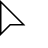
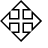
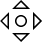
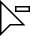
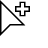

In [7]:
from raiwidgets import ExplanationDashboard
ExplanationDashboard(global_explanation, model, dataset=x_test_subset, true_y=y_test)